In [1]:
%matplotlib inline
from IPython.display import HTML,Image,SVG,YouTubeVideo

# Edge detection

Edges are important features in an image, this is one of the most saillant feature that the human eye is able to catch. Edges are also highly correlated with object borders, which is why a lot of different techniques have been developped.

## Finite differences

Let's remember the Taylor's theorem with the next development :
$$
\begin{align*}
f(x + h) &= f(x) + \frac{f'(x)}{1!}h + \frac{f''(x)}{2!}h^2 + \dots + \frac{f^{(n)}(x)}{n!}h^n + R_n(x)\\
f(x + h) &= f(x) + f'(x)h + R_1^+(x)\\
f(x - h) &= f(x) - f'(x)h + R_1^-(x)
\end{align*}
$$
with $R_{n}$ being the rest of the development at the $n^{\textrm{th}}$ order. Let's take the developments truncated at the first order, let's neglect $R_1$ and let's substract the two last equations of the former development.
$$
\begin{align*}
f(x + h) - f(x - h) &\approx  2 \ f'(x) \ h  \\
\Rightarrow f'(x) &\approx \frac{f(x + h) - f(x - h)}{2h}  \\
\\
\end{align*}
$$
Similar steps can be done for $f''(x)$. The result of those is given in the next equation.
$$
f''(x) \approx \frac{f(x+h) - 2 \ f(x) + f(x-h)}{h^{2}}
$$

For functions with two variables $f(x,y)$, the derivation can be made either with respect to $x$, with respect to $y$ or with respect to both. The next lines show the results of the former steps applied to each of these scenarios, $f_{ij}$ being equal to $\dfrac{\partial}{\partial i} \left( \dfrac{\partial}{\partial j} \right) f$.
$$
\begin{align}
    f_{x}(x,y) &\approx \frac{f(x+h ,y) - f(x-h,y)}{2h}\\
    f_{y}(x,y) &\approx \frac{f(x,y+k ) - f(x,y-k)}{2k}\\
    f_{xx}(x,y) &\approx \frac{f(x+h ,y) - 2 f(x,y) + f(x-h,y)}{h^2}\\
    f_{yy}(x,y) &\approx \frac{f(x,y+k) - 2 f(x,y) + f(x,y-k)}{k^2}\\
    f_{xy}(x,y) &\approx \frac{f(x+h,y+k) - f(x+h,y-k) - f(x-h,y+k) + f(x-h,y-k)}{4hk}\\
\end{align}
$$

The Laplacian operator $\Delta$ is given by the next equations, with $\nabla$ being the gradient operator, defined as $\nabla f  = \left(\frac{\partial f}{\partial x_1 }, \dots,  \frac{\partial f}{\partial x_n }  \right)$.
$$
\begin{align}
\Delta f &= \nabla^2 f = \nabla \cdot \nabla f\\
\Delta f &= \sum_{i=1}^n \frac {\partial^2 f}{\partial x^2_i}\\
\Delta f &= \nabla^2 f = \frac {\partial^2 f}{\partial x^2} + \frac {\partial^2 f}{\partial y^2}\\
\end{align}
$$

For images,these operators are identical to convolutions with specific structuring element:

example 1D second-derivative is obtained using:

\begin{bmatrix}
1 & -2 & 1\\
\end{bmatrix}

2D Laplacian:
\begin{bmatrix}
0 & -1 & 0\\
-1 & +4 & -1\\
0 & -1 & 0\\
\end{bmatrix}

2D including diagonals:

\begin{bmatrix}
-1 & -1 & -1\\
-1 & +8 & -1\\
-1 & -1 & -1\\
\end{bmatrix}

3D Laplacian (stucturing element is a 3x3x3 cube):

\begin{bmatrix}
0 & 0 & 0\\
0 & 1 & 0\\
0 & 0 & 0\\
\end{bmatrix}

\begin{bmatrix}
0 & 1 & 0\\
1 & -6 & 1\\
0 & 1 & 0\\
\end{bmatrix}

\begin{bmatrix}
0 & 0 & 0\\
0 & 1 & 0\\
0 & 0 & 0\\
\end{bmatrix}

## Gradient operator

As introduced before, the gradient operator noted $\nabla$ is given by the equation below.
$$
\begin{align}
    \nabla f  = \left(\frac{\partial f}{\partial x_1 }, \dots,  \frac{\partial f}{\partial x_n }  \right)
\end{align}
$$
This last equation is written for $n$ dimensions. In image processing the signals are either in 2D or 3D. The gradient operator for those two cases are thus defined by the equations below.
- 2D : $\nabla f(x, y) = \left(\frac{\partial f}{\partial x},\frac{\partial f}{\partial y}\right)$
- 3D : $\nabla f(x, y, z) = \left(\frac{\partial f}{\partial x},\frac{\partial f}{\partial y},\frac{\partial f}{\partial z}\right)$

Technically, a gradient is a vector field, so functions of the amplitude and the angle of this vector field can be computed ; they are shown for the 2D case, being the most frequent case in imaging, in the next equations.
- Amplitude : $A = \sqrt { (\frac{\partial f}{\partial x})^2 + (\frac{\partial f}{\partial y})^2 }$
- Angle : $\varphi = \tan^{-1} \left( \dfrac{\frac{\partial f}{\partial x}} {\frac{\partial f}{\partial y}} \right)$

An example of such a gradient, with its amplitude and its angle, is given in the following code.

C:\Users\HP\AppData\Local\Temp\ipykernel_26008\3130671742.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve1d


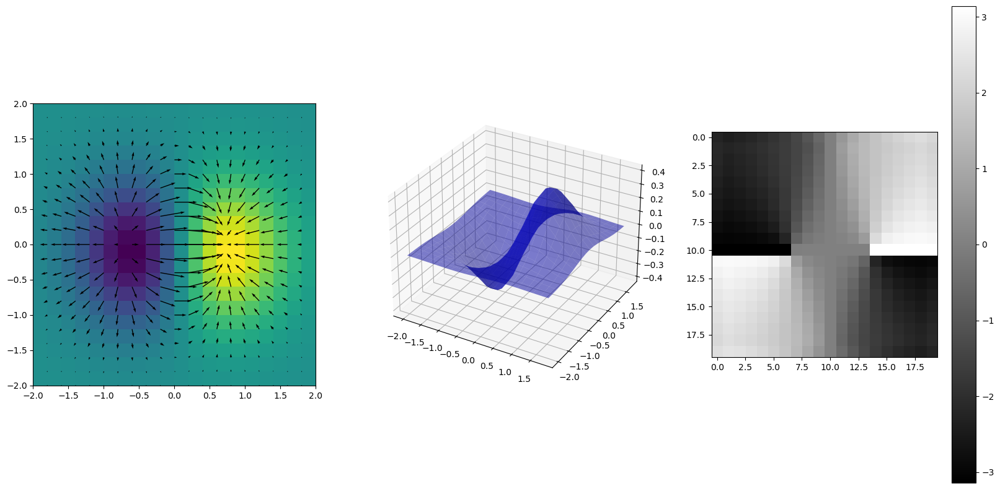

In [3]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from scipy import ndimage,interpolate
from scipy.ndimage.filters import convolve1d
from mpl_toolkits.mplot3d import Axes3D

r = np.arange(-2, 2, 0.2)
x,y = np.meshgrid(r,r)

z = x*np.exp(-x**2-y**2)

w = np.array([-1,0,+1])

dx = convolve1d(z,-w,axis=1)
dy = convolve1d(z,-w,axis=0)

fig = plt.figure(figsize=[20,10])
plt.subplot(131)
plt.imshow(z,extent=[-2,2,-2,2])
plt.quiver(x,y,dx,dy)
ax = fig.add_subplot(1,3,2, projection='3d')
surf = ax.plot_surface(x, y, z, rstride=1, cstride=1, linewidth=0.2,color=[0.,0.,.8,.5])
plt.subplot(133)
plt.imshow(np.arctan2(dy,dx),cmap=plt.cm.gray)
plt.colorbar()


Here is a concrete example of the application of the gradient operator to the classic cameraman image.

C:\Users\HP\AppData\Local\Temp\ipykernel_26008\3820231191.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve,convolve1d,gaussian_filter
C:\Users\HP\AppData\Local\Temp\ipykernel_26008\3820231191.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve,convolve1d,gaussian_filter
C:\Users\HP\AppData\Local\Temp\ipykernel_26008\3820231191.py:5: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve,convolve1d,gaussian_filter
C:\Program Files\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,
C:\Users\HP\AppData\Local

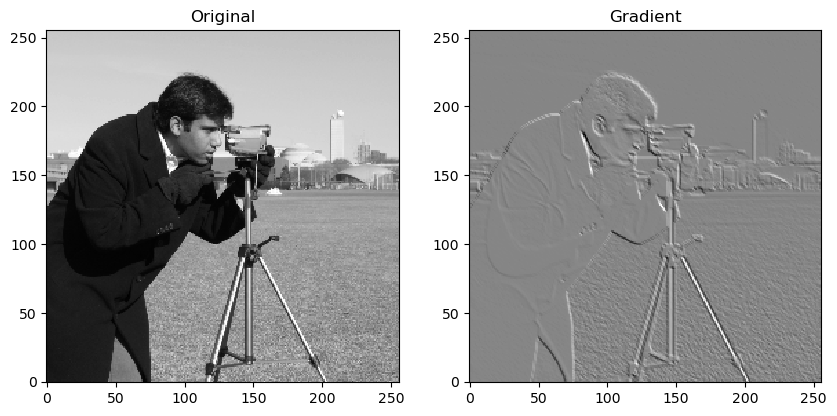

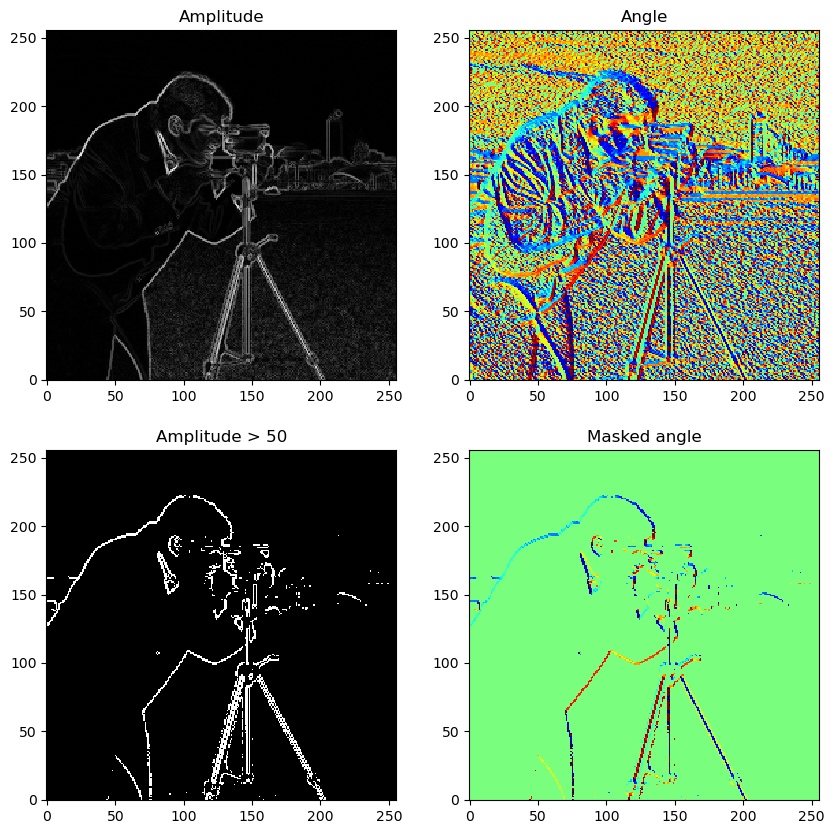

In [4]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as npy
from scipy import ndimage,interpolate
from scipy.ndimage.filters import convolve,convolve1d,gaussian_filter
from mpl_toolkits.mplot3d import Axes3D
from skimage.data import camera

def Cx(ima):
    """x' derivative of image"""
    c = convolve1d(ima,npy.array([-1,0,1]),axis=1,cval=1)
    return c/2.0

def Cy(ima):
    """y' derivative of image"""
    c = convolve1d(ima,npy.array([-1,0,1]),axis=0,cval=1)
    return c/2.0

def grad(ima):
    """gradient of an image"""
    k = npy.array([[0,1,0],[1,0,-1],[0,-1,0]])
    s = convolve(ima,k)
    return s



im = camera().astype(np.float)[-1::-2,::2]
s = grad(im)

plt.figure(figsize=[10,10])
plt.subplot(1,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title("Original")
plt.subplot(1,2,2)
plt.imshow(s,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title("Gradient")

gx = Cx(im)
gy = Cy(im)

magnitude = np.sqrt(gx**2+gy**2)
angle = np.arctan2(gy,gx)
masked_angle = angle.copy()
masked_angle[magnitude<50]=0

plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(magnitude,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('Amplitude')
plt.subplot(2,2,2)
plt.imshow(angle,interpolation='nearest',cmap=cm.jet,origin='lower')
plt.title('Angle')
plt.subplot(2,2,3)
plt.imshow(magnitude>50,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('Amplitude > 50')
plt.subplot(2,2,4)
plt.imshow(masked_angle,interpolation='nearest',cmap=cm.jet,origin='lower')
plt.title('Masked angle');

## Gradient amplitude

As said before, the gradient is a vectorial function, given by the equation below.
$$
\vec{\nabla} \left( f \right) = 
\begin{bmatrix}
G_x \\
G_y
\end{bmatrix}
=
\begin{bmatrix}
\frac{\partial f}{\partial x} \\
\frac{\partial f}{\partial y} \\
\end{bmatrix}
$$
This vector has an amplitude, which is given by the following equation.
$$
\nabla \left( f \right) = \left\| \vec{\nabla} \left( f \right) \right\| = \sqrt{G_{x}^{2} + G_{x}^{2}}
$$
This last result can be approximated by the following simplified equation, which results in an increase of the processing speed.
$$
\nabla \left( f \right) \approx G_x + G_y
$$
There exist different versions of the gradient amplitude extraction from an image. These are presented in the next sections. Examples of each of these operators are given afterwards.

### Robert's operator

Robert defines the local image gradient amplitude by the following equation.
$$
\left\| \vec{\nabla} \left( f \right) \right\| = \left\vert f(x,y)-f(x+1,y+1) \right\vert + \left\vert f(x+1,y)-f(x,y+1)\right\vert $$
This corresponds to a simple convolution with the two following structuring elements.
$$
\begin{split}
    \begin{bmatrix}
        1 & 0 \\
        0 & -1 \\
    \end{bmatrix}
    \begin{bmatrix}
        0 & 1 \\
        -1 & 0 \\
    \end{bmatrix}
\end{split}
$$

### Prewitt

Prewitt's operator detects horizontal and vertical borders using the following structuring elements.
$$
\begin{split}
    \begin{bmatrix}
        -1 & -1 & -1\\
        0 & 0 & 0\\
        1 & 1 & 1\\
    \end{bmatrix}
    \begin{bmatrix}
        -1 & 0 & 1\\
        -1 & 0 & 1\\
        -1 & 0 & 1\\
    \end{bmatrix}
\end{split}
$$

### Sobel

Similarly to Prewitt's opertor, Sobel's operator is a border detector, using two orthogonal filters that are given below.
$$
\begin{split}
    \begin{bmatrix}
        1 & 0 & -1\\
        2 & 0 & -2\\
        1 & 0 & -1\\
    \end{bmatrix}
    \begin{bmatrix}
        1 & 2 & 1\\
        0 & 0 & 0\\
        -1 & -2 & -1\\
    \end{bmatrix}
\end{split}
$$

Text(0.5, 1.0, 'Sobel')

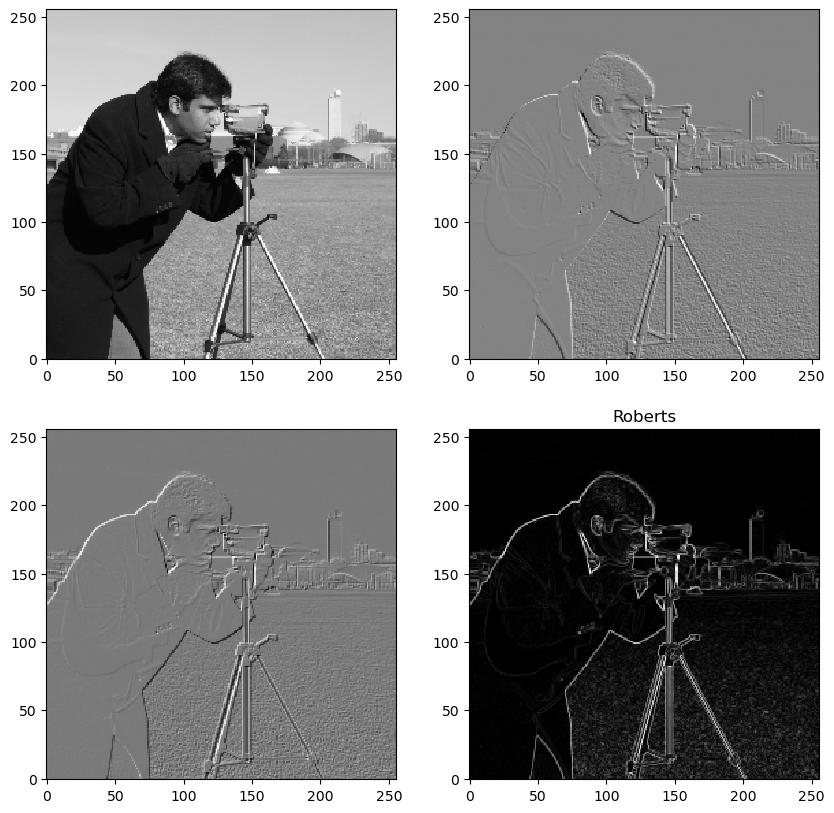

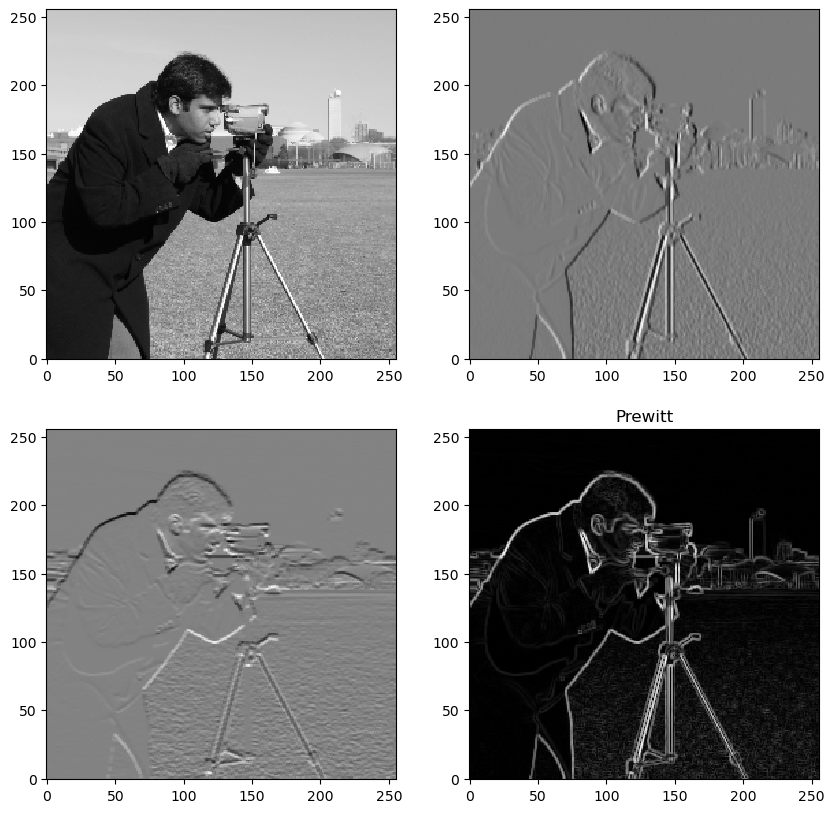

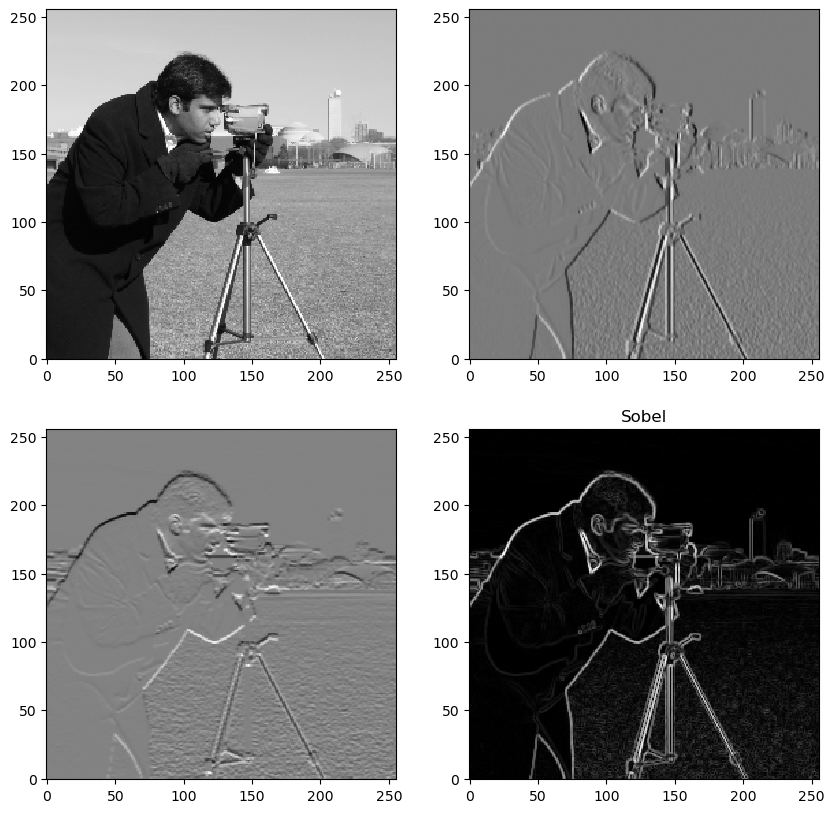

In [6]:
def sobel(ima):
    """Sobel  of image"""
    kx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
    ky = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
    sx = convolve(ima,kx)
    sy = convolve(ima,ky)
    s = np.sqrt(sx**2+sy**2)
    return (sx,sy,s)

def prewitt(ima):
    """Sobel  of image"""
    kx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
    ky = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
    sx = convolve(ima,kx)
    sy = convolve(ima,ky)
    s = np.sqrt(sx**2+sy**2)
    return (sx,sy,s)

def roberts(ima):
    """Sobel  of image"""
    kx = np.array([[1,0],[0,-1]])
    ky = np.array([[0,1],[-1,0]])
    sx = convolve(ima,kx)
    sy = convolve(ima,ky)
    s = np.sqrt(sx**2+sy**2)
    return (sx,sy,s)

sx,sy,s = roberts(im)

plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,2)
plt.imshow(sx,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,3)
plt.imshow(sy,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,4)
plt.imshow(s,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('Roberts');

sx,sy,s = prewitt(im)

plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,2)
plt.imshow(sx,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,3)
plt.imshow(sy,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,4)
plt.imshow(s,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('Prewitt')

sx,sy,s = sobel(im)

plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,2)
plt.imshow(sx,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,3)
plt.imshow(sy,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,4)
plt.imshow(s,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('Sobel')

### Morphological gradient

A gradient can be easily found by substracting the local minimum from the local maximum. This technique is called the morphological gradient, referencing to the morphological operators that will be introduced later. An example of this technique is given in the code below.

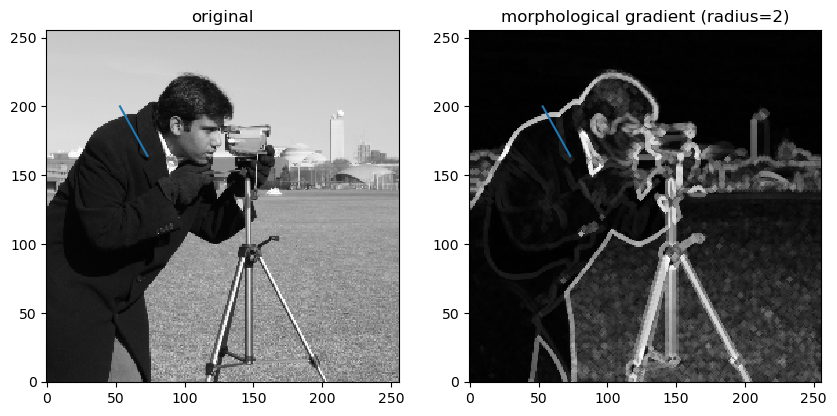

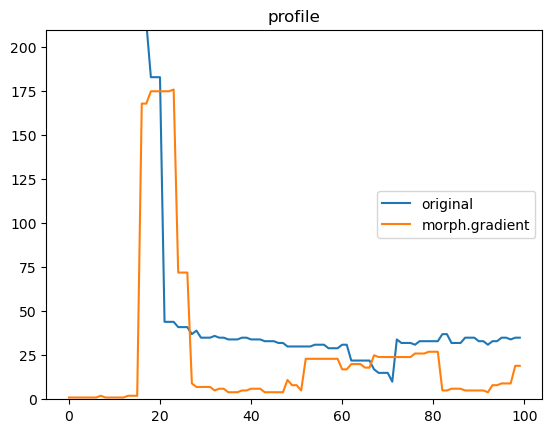

In [8]:
from skimage.morphology import disk
import skimage.filters.rank as skr
from scipy import ndimage

def profile(ima,p0,p1,num):
    n = np.linspace(p0[0],p1[0],num)
    m = np.linspace(p0[1],p1[1],num)
    return [n,m,ndimage.map_coordinates(ima, [m,n], order=0)]

im = camera()[-1::-2,::2]

#filtered version
radius = 2
selem = disk(radius)
rank1 = skr.maximum(im,selem)
rank2 = skr.minimum(im,selem)
rank3 = skr.gradient(im,selem)
[x,y,p] = profile(im,(53,200),(73,164),100)
[x,y,prank1] = profile(rank1,(53,200),(73,164),100)
[x,y,prank2] = profile(rank2,(53,200),(73,164),100)
[x,y,prank3] = profile(rank3,(53,200),(73,164),100)

fig = plt.figure(1,figsize=[10,10])
plt.subplot(1,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('original')
plt.plot(x,y)
plt.subplot(1,2,2)
plt.imshow(rank3,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('morphological gradient (radius=%d)'%radius)
plt.plot(x,y)

fig = plt.figure(2)
plt.plot(p,label='original')
plt.plot(prank3,label='morph.gradient')
plt.title('profile')
plt.gca().set_ylim([0,210])
plt.legend(loc=5);

Two other related morphological gradient are the following :
- the top-hat morphological gradient, which corresponds to the local maximum minus the original image,
- the bottom-hat morphological gradient, which corresponds to the original image minus the local minimum.

These two filters give thinner borders than the others, but they are not centered. An example of these morphological gradients are given in the following codes.

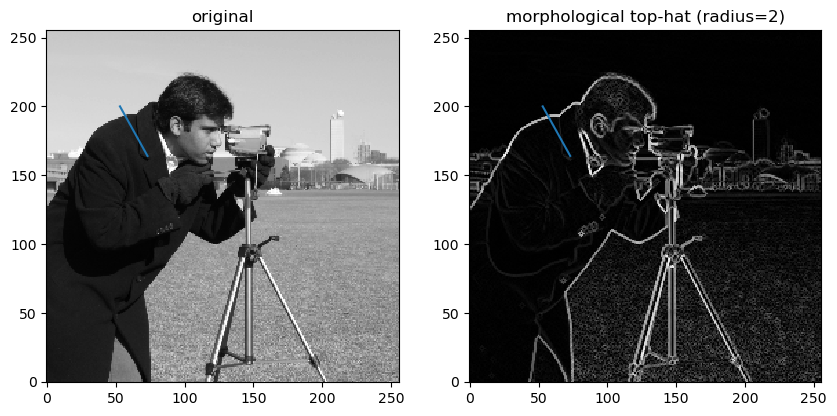

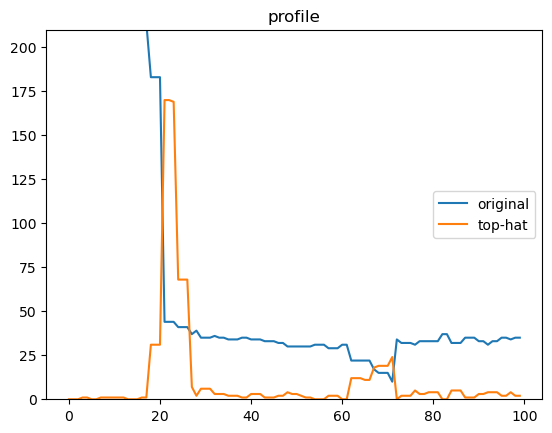

In [9]:
top_hat = rank1 - im
bottom_hat = im - rank2
[x,y,p] = profile(im,(53,200),(73,164),100)
[x,y,prank1] = profile(im,(53,200),(73,164),100)
[x,y,prank2] = profile(top_hat,(53,200),(73,164),100)
[x,y,prank3] = profile(bottom_hat,(53,200),(73,164),100)

fig = plt.figure(1,figsize=[10,10])
plt.subplot(1,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('original')
plt.plot(x,y)
plt.subplot(1,2,2)
plt.imshow(top_hat,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('morphological top-hat (radius=%d)'%radius)
plt.plot(x,y)

fig = plt.figure(2)
plt.plot(p,label='original')
plt.plot(prank2,label='top-hat')
plt.title('profile')
plt.gca().set_ylim([0,210])
plt.legend(loc=5);

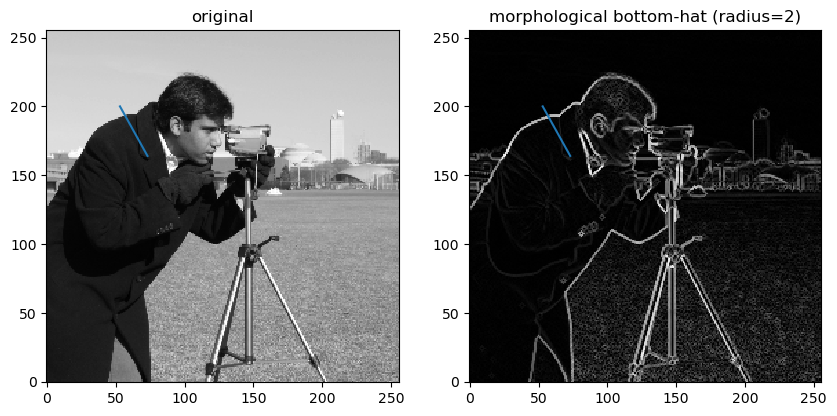

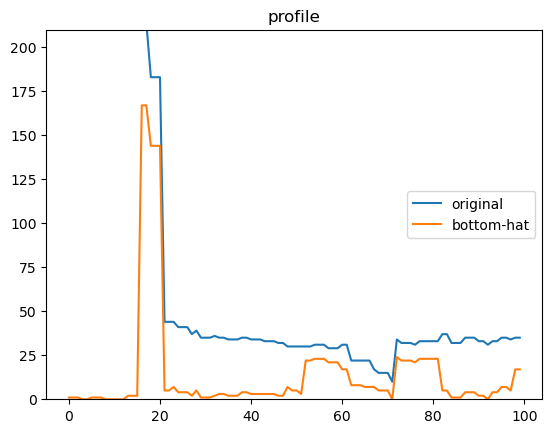

In [10]:
fig = plt.figure(1,figsize=[10,10])
plt.subplot(1,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('original')
plt.plot(x,y)
plt.subplot(1,2,2)
plt.imshow(top_hat,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('morphological bottom-hat (radius=%d)'%radius)
plt.plot(x,y)

fig = plt.figure(2)
plt.plot(p,label='original')
plt.plot(prank3,label='bottom-hat')
plt.title('profile')
plt.gca().set_ylim([0,210])
plt.legend(loc=5);

A special attention must be paid to the used border detection method : the size of the detected objects may be inluenced.
> The top-hat transform is over-estimating the size of bright objects and under-estimating the size of dark objects. On the contrary, the bottom-hat is shifting borders in the reverse direction.

### Laplacian of gaussian

The laplacian of gaussian is a combination of a high-pass laplacian filter applied on a gaussian low-pass filtered image. The 2D gaussian kernel is defined by the following equation?
$$
G(x,y;\sigma) = \frac{1}{2 \ \pi \ \sigma^2} \ e ^{-\left( \frac{x^2+y^2}{2 \ \sigma^2}\right)}
$$

Knowing that the laplacian is given by $\Delta f = \sum_{i=1}^n \frac {\partial^2 f}{\partial x^2_i}$, the laplacian of the gaussian kernel is given by the next equation.
$$
L \circ G (x,y;\sigma) = \Delta \left[ \frac{1}{2 \ \pi \ \sigma^2} \ e ^{-\left( \frac{x^2+y^2}{2 \ \sigma^2}\right)} \right] = - \frac{1}{\pi \ \sigma^4} \left[ 1-\frac{x^2+y^2}{2 \ \sigma ^2}\right] e ^{-\left(\frac{x^2+y^2}{2 \ \sigma^2}\right)}
$$
The next code plots a 3D mesh of the function, illustrating the concept of laplacian of gaussian.

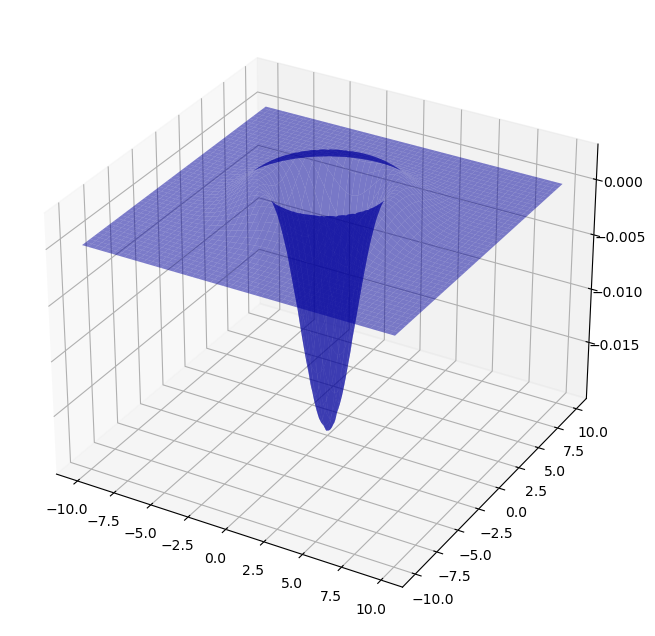

In [11]:
sigma = 2.
X,Y = np.meshgrid(np.arange(-10.,10,.1),np.arange(-10.,10,.1))
e = (X**2+Y**2)/(2*sigma**2)

Z = - 1./(np.pi * sigma**4)*(1-e)*np.exp(-e)

fig3d = plt.figure(figsize=[8,8])
ax = fig3d.add_subplot(1, 1, 1, projection='3d')
surf = ax.plot_surface(X, Y, Z, linewidth=.2,color=[0.,0.,.8,.5])

### Difference of Gaussian (DoG) operator
The 2D Gaussian kernel, just like before, is given by the next equation.
$$
G(x,y;\sigma) = \frac{1}{2 \ \pi \ \sigma^2} \ e ^{-\left( \frac{x^2+y^2}{2 \ \sigma^2}\right)}
$$
The convolution of an image with a gaussian kernel is simply given by $L(x, y ; \sigma)\ = g(x, y ; \sigma) \ast f(x, y)$, and the DoG is simply the convolution of a signal with the difference of two separate gaussian kernels.
$$
L(x, y ; \sigma)\ = \left[ G(x, y ; \sigma _1) - G(x, y ; \sigma _2) \right] \ast f(x, y)
$$
The next codes first plot a 3D mesh of the function, illustrating the concept of DoF, then applies the concept to the cameraman image.

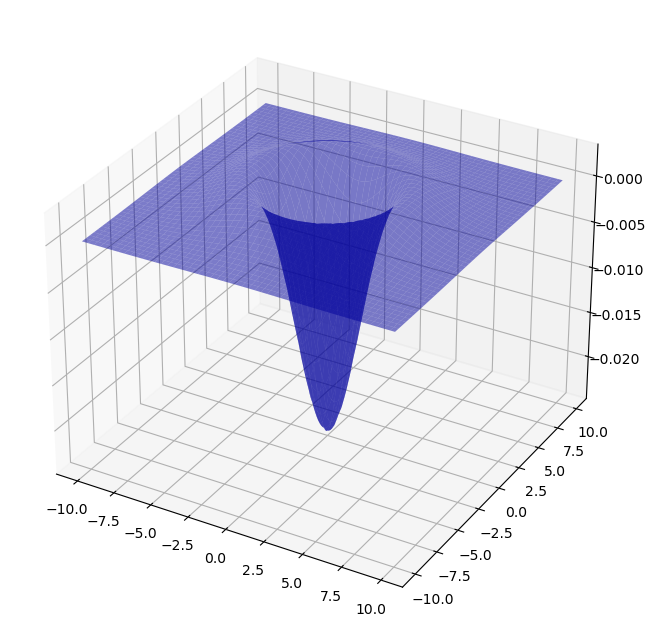

In [12]:
sigma1 = 2
sigma2 = sigma1*1.6
X,Y = np.meshgrid(np.arange(-10.,10,.1),np.arange(-10.,10,.1))
Z1 = 1./(2*np.pi * sigma1**2)*np.exp(-(X**2+Y**2)/(2*sigma1**2))
Z2 = 1./(2*np.pi * sigma2**2)*np.exp(-(X**2+Y**2)/(2*sigma2**2))

fig3d = plt.figure(figsize=[8,8])
ax = fig3d.add_subplot(1, 1, 1, projection='3d')
surf = ax.plot_surface(X, Y, Z2-Z1, linewidth=.2,color=[0.,0.,.8,.5])

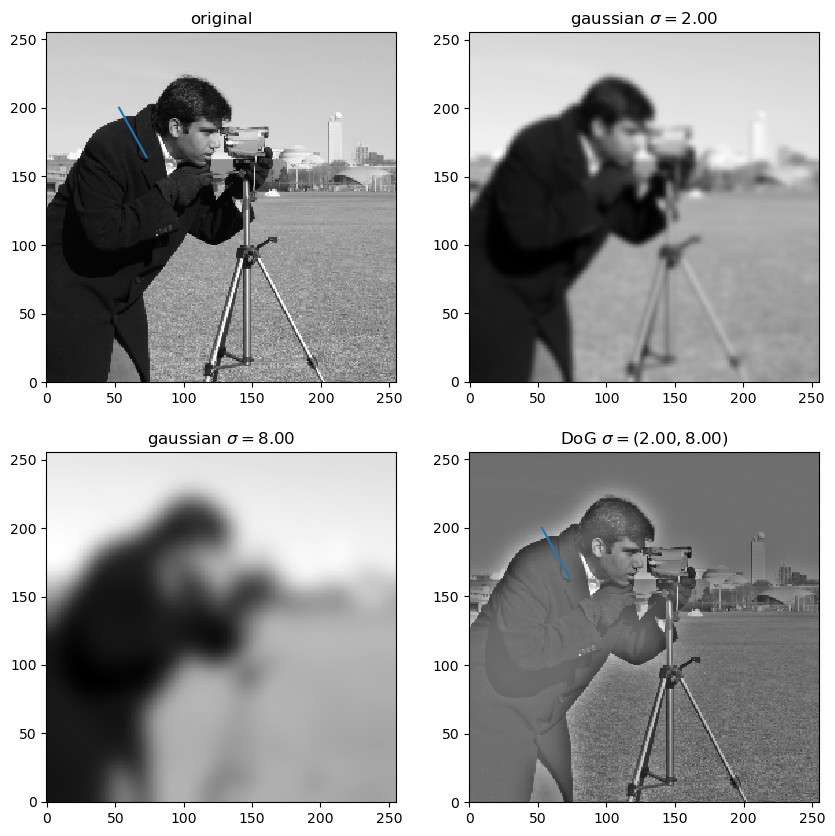

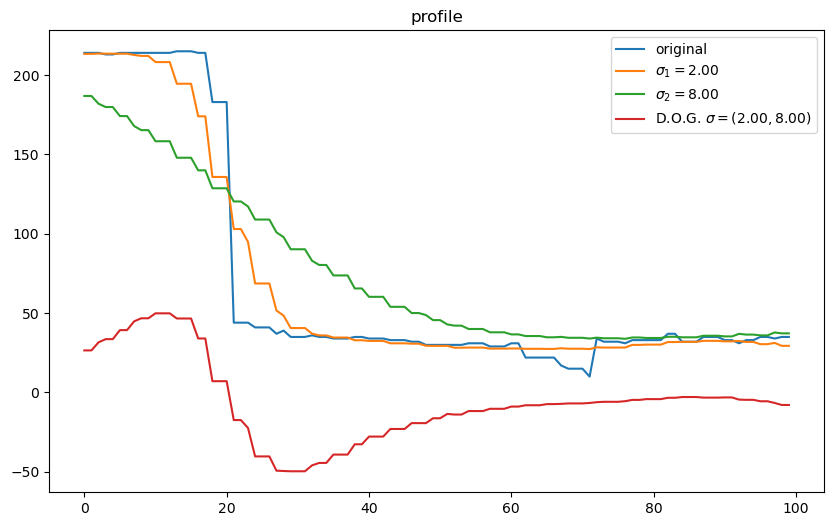

In [14]:
im = 1.*camera()[-1::-2,::2]

sigma1 = 2.
sigma2 = 4*sigma1
g1 = gaussian_filter(im,sigma1)
g2 = gaussian_filter(im,sigma2)

[x,y,p] = profile(im,(53,200),(73,164),100)
[x,y,p_s1] = profile(g1,(53,200),(73,164),100)
[x,y,p_s2] = profile(g2,(53,200),(73,164),100)
[x,y,p_s12] = profile(g1-g2,(53,200),(73,164),100)


plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.plot(x,y)
plt.gca().set_xlim(0,255)
plt.gca().set_ylim(0,255)
plt.title('original')
plt.subplot(2,2,2)
plt.imshow(g1,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('gaussian $\sigma=%.2f$'%sigma1)
plt.subplot(2,2,3)
plt.imshow(g2,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('gaussian $\sigma=%.2f$'%sigma2)
plt.subplot(2,2,4)
plt.imshow(1.*im-g2,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('DoG $\sigma=(%.2f,%.2f)$'%(sigma1,sigma2));
plt.plot(x,y)
plt.gca().set_xlim(0,255)
plt.gca().set_ylim(0,255)


plt.figure(figsize=[10,6])
plt.plot(p,label='original')
plt.plot(p_s1,label='$\sigma_1=%.2f$'%sigma1)
plt.plot(p_s2,label='$\sigma_2=%.2f$'%sigma2)
plt.plot(p_s12,label='D.O.G. $\sigma=(%.2f,%.2f)$'%(sigma1,sigma2))
plt.title('profile')
plt.legend(loc=1);

# Gaussian and Laplacian pyramids



As a reminder, a gaussian pyramid is obtained by successfuly applying a gaussian filter then reducing the size of the image by two. A laplacian pyramid follows the same concept, but applies not a gaussian filter, but the difference image of the blurred versions between each levels.

C:\Users\HP\AppData\Local\Temp\ipykernel_26008\751811125.py:6: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  pyramid = tuple(pyramid_gaussian(image, downscale=2, multichannel=True))


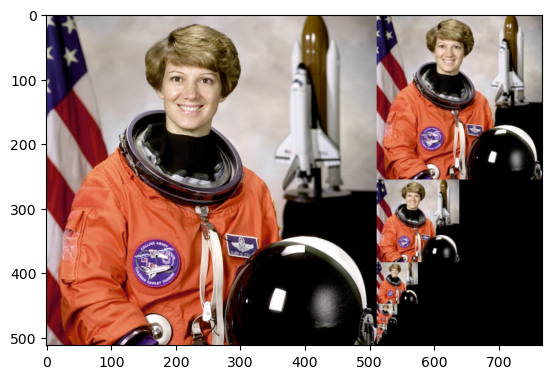

In [15]:
from skimage import data
from skimage.transform import pyramid_gaussian,pyramid_laplacian

image = data.astronaut()
rows, cols, dim = image.shape
pyramid = tuple(pyramid_gaussian(image, downscale=2, multichannel=True))

composite_image = np.zeros((rows, cols + cols // 2, 3), dtype=np.double)

composite_image[:rows, :cols, :] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p
    i_row += n_rows

fig, ax = plt.subplots()
ax.imshow(composite_image)
plt.show()

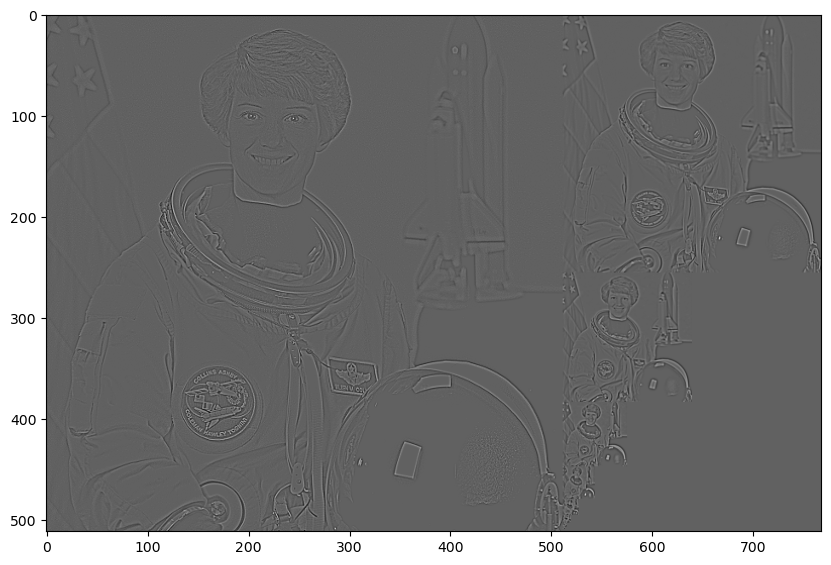

In [16]:
pyramid = tuple(pyramid_laplacian(image[:,:,0], downscale=2))

composite_image = np.zeros((rows, cols + int(cols/2)), dtype=np.double)

composite_image[:rows, :cols] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p
    i_row += n_rows

plt.figure(figsize=[10,10])
plt.imshow(composite_image,cmap=cm.gray);

# Canny edge detection



In order to introduce the concept of Canny edge detection, the following codes illustrate two manners of detecting the edges of a same object : the Canny edge detection algorithm, and afterwards the gradient method.

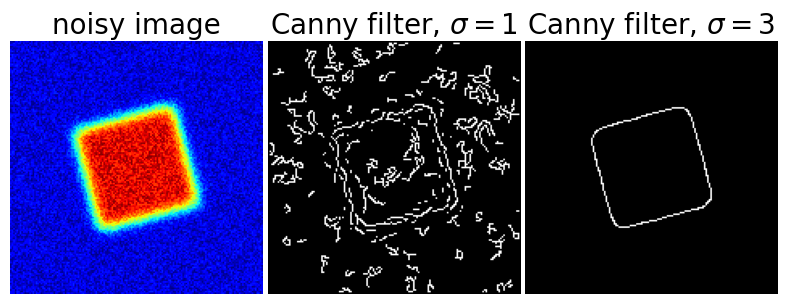

In [17]:
from scipy import ndimage
from skimage import feature

# Generate noisy image of a square
im = np.zeros((128, 128))
im[32:-32, 32:-32] = 1

im = ndimage.rotate(im, 15, mode='constant')
im = ndimage.gaussian_filter(im, 4)
im += 0.2 * np.random.random(im.shape)

# Compute the Canny filter for two values of sigma
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=3)

# display results
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(8, 3))

ax1.imshow(im, cmap=plt.cm.jet)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)

ax2.imshow(edges1, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title('Canny filter, $\sigma=1$', fontsize=20)

ax3.imshow(edges2, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title('Canny filter, $\sigma=3$', fontsize=20)

fig.subplots_adjust(wspace=0.02, hspace=0.02, top=0.9,
                    bottom=0.02, left=0.02, right=0.98)

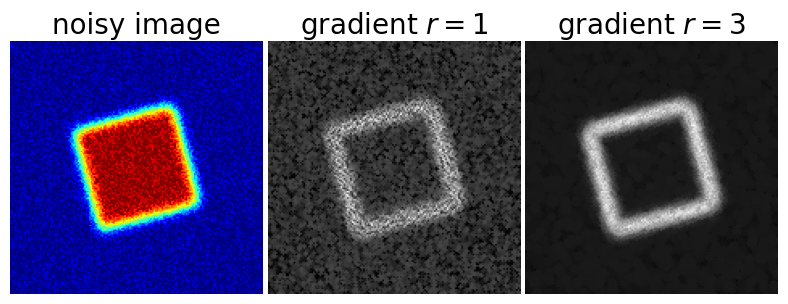

In [20]:
from skimage.morphology import disk
import skimage.filters.rank as skr

# Generate noisy image of a square
im = np.zeros((128, 128))
im[32:-32, 32:-32] = 1

im = ndimage.rotate(im, 15, mode='constant')
im = ndimage.gaussian_filter(im, 4)
im += 0.2 * np.random.random(im.shape)-.1
im[im>1] = 1 #clip image
im[im<0] = 0 #clip image
im = (im*255).astype(np.uint8)
mgrad0 = skr.gradient(im,disk(1))
mgrad1 = skr.gradient(im,disk(3))

# display results
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(8, 3))

ax1.imshow(im, cmap=plt.cm.jet)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)

ax2.imshow(mgrad0, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title('gradient $r=1$', fontsize=20)

ax3.imshow(mgrad1, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title('gradient $r=3$', fontsize=20)

fig.subplots_adjust(wspace=0.02, hspace=0.02, top=0.9,
                    bottom=0.02, left=0.02, right=0.98)

## Canny edge detection algorithm

Here below are listed the steps of the algorithm :
1. image smoothing,
2. gradient intensity detection,
3. local non-maximum suppression,
4. double border intensity threshold,
5. weak edge suppression.

### Image smoothing

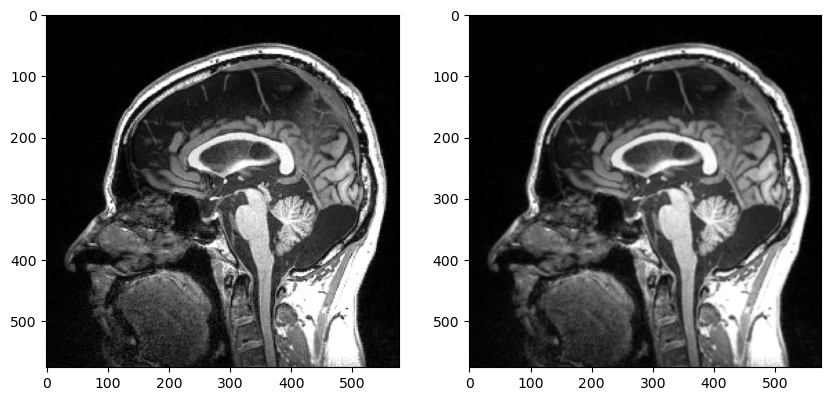

In [21]:
from skimage.io import imread
from skimage.filters import gaussian

ct = imread('https://upload.wikimedia.org/wikipedia/commons/5/5f/MRI_EGC_sagittal.png')
plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(ct);

smooth_ct = gaussian(ct[:,:,0],1.)
plt.subplot(1,2,2)
plt.imshow(smooth_ct,cmap=plt.cm.gray);

### Gradient intensity detection

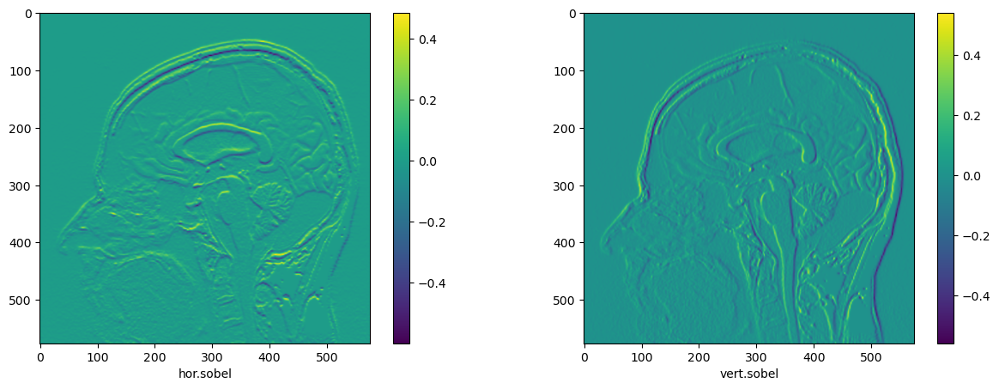

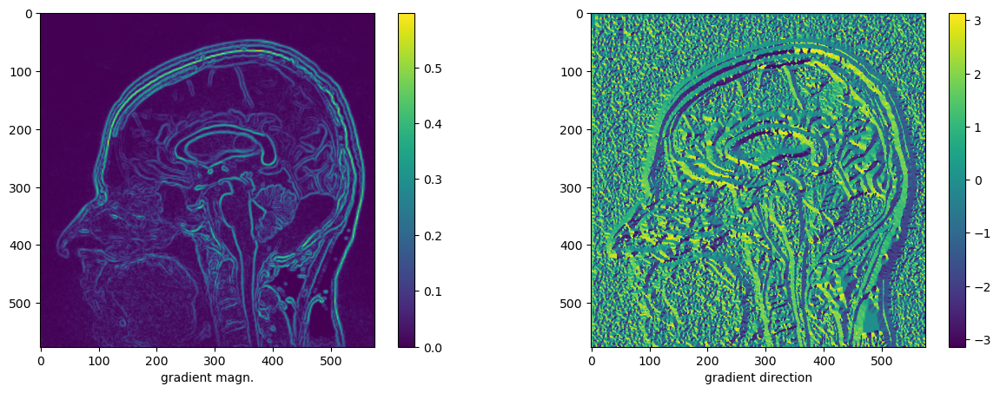

In [22]:
from skimage.filters import sobel_h,sobel_v

sh = sobel_h(smooth_ct)
sv = sobel_v(smooth_ct)
plt.figure(figsize=[15,5])
plt.subplot(1,2,1)
plt.imshow(sh)
plt.colorbar();
plt.xlabel('hor.sobel')
plt.subplot(1,2,2)
plt.imshow(sv)
plt.colorbar()
plt.xlabel('vert.sobel')

gm = np.sqrt(sh**2.+sv**2.)

angle = np.arctan2(sv,sh)

plt.figure(figsize=[15,5])
plt.subplot(1,2,1)
plt.imshow(gm)
plt.colorbar();
plt.xlabel('gradient magn.')
plt.subplot(1,2,2)
plt.imshow(angle)
plt.colorbar()
plt.xlabel('gradient direction');



### Local non-maximum suppression

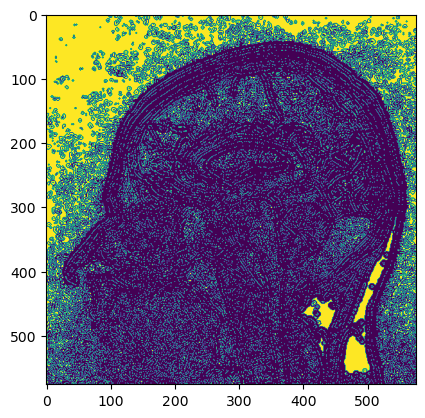

In [23]:
from skimage.morphology import disk
import skimage.filters.rank as skr

local_max = gm*255 >= skr.maximum((gm*255).astype(np.uint8),disk(1))
plt.imshow(local_max);

### Double border intensity threshold

These thresholds are arbitrary. For example :
- weak border are $\geq$ 10% of image maximum,
- strong border are $\leq$ 20% of image maximum.

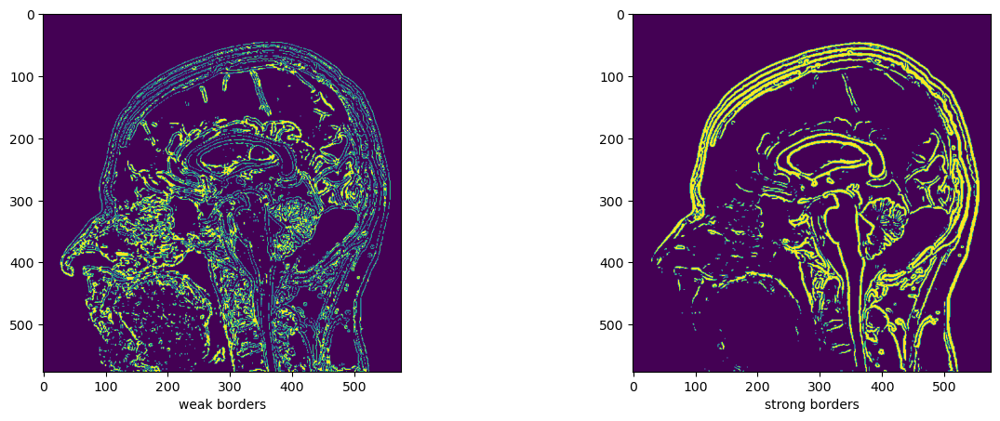

In [24]:
image_max = np.max(gm)
weak_borders = np.logical_and(.1*image_max <= gm, gm < .2*image_max)
strong_borders = gm >= .2*image_max
plt.figure(figsize=[15,5])
plt.subplot(1,2,1)
plt.imshow(weak_borders)
plt.xlabel('weak borders')
plt.subplot(1,2,2)
plt.imshow(strong_borders)
plt.xlabel('strong borders');


### Weak edge suppression

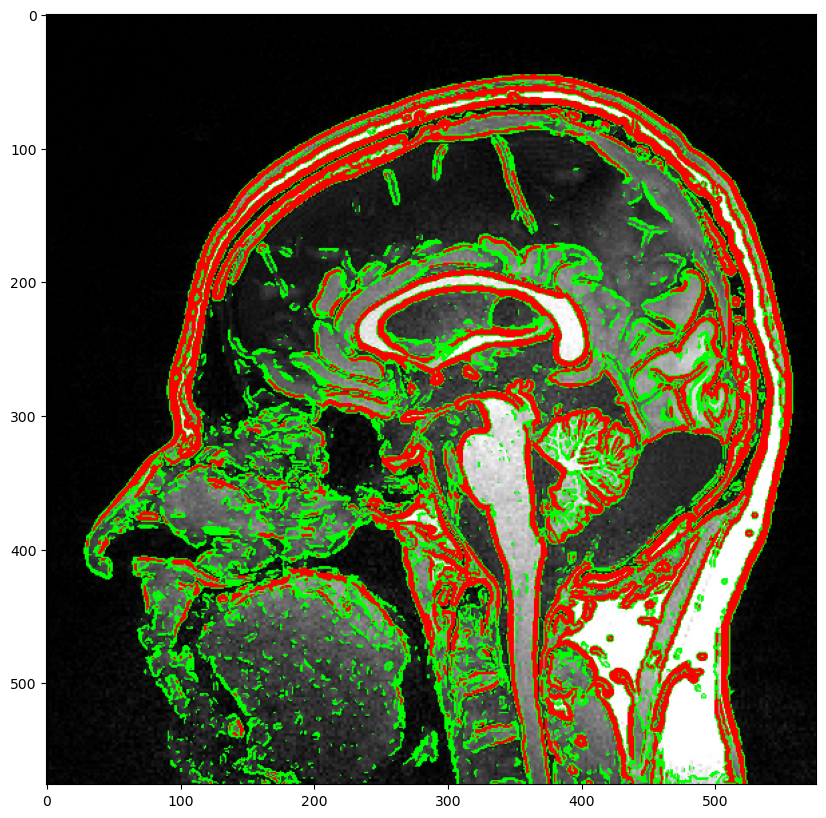

In [25]:
masked_ct = ct.copy()
masked_ct[weak_borders,:]=[0,255,0,255]
masked_ct[strong_borders,:]=[255,0,0,255]
plt.figure(figsize=[10,10])
plt.imshow(masked_ct);

### Result of the Canny edge detection algorithm implementation

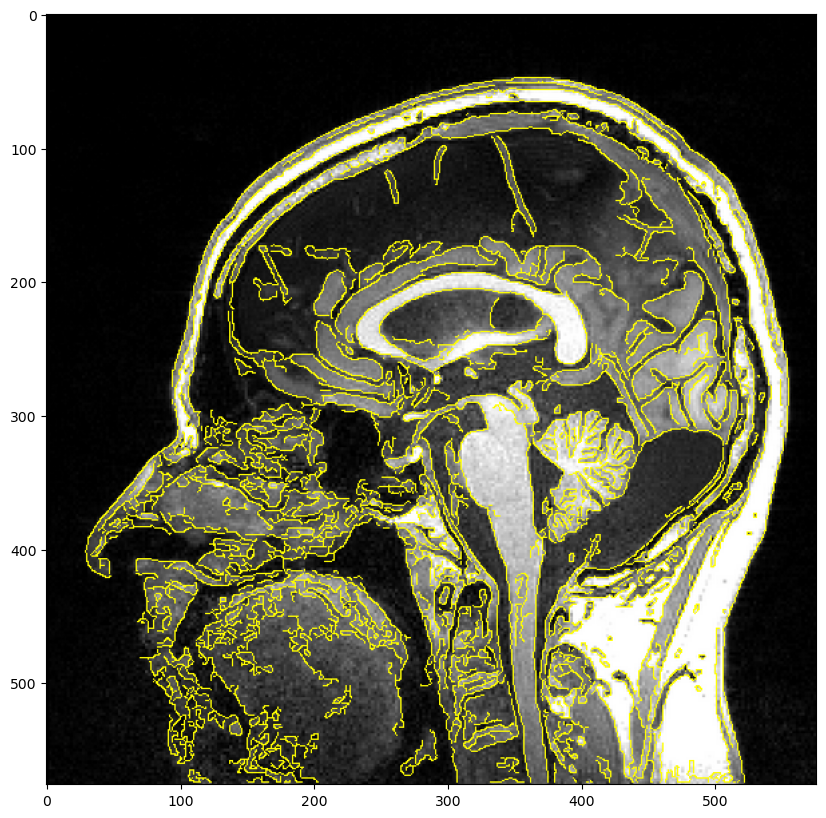

In [27]:
from skimage import feature
canny = feature.canny(ct[:,:,0],low_threshold=.1*255,high_threshold=.4*255)
masked_ct = ct.copy()
masked_ct[canny,:]=[255,255,0,255]
plt.figure(figsize=[10,10])
plt.imshow(masked_ct);

### Comparison between Canny edge detection algorithm and Sobel edge algorithm

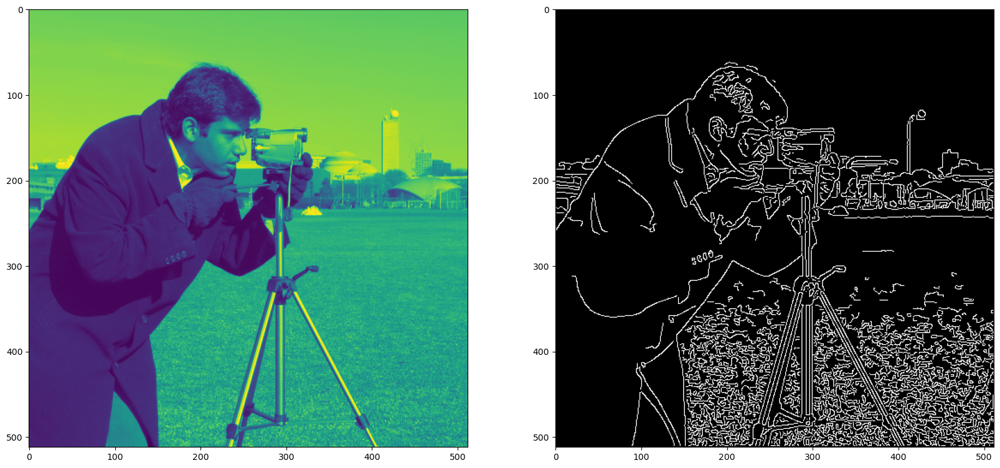

In [28]:
im = camera()
canny = feature.canny(im)*255

plt.figure(figsize=[20,10])
plt.subplot(1,2,1)
plt.imshow(im)
plt.subplot(1,2,2)
plt.imshow(canny,cmap=plt.cm.gray);


C:\Users\HP\AppData\Local\Temp\ipykernel_26008\1862168162.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = camera().astype(np.float)


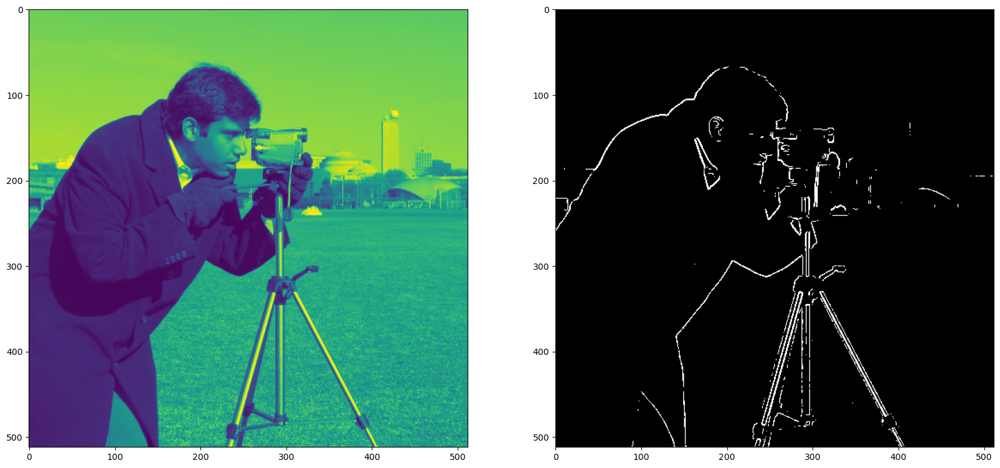

In [30]:
im = camera().astype(np.float)
_,_,fsobel = sobel(im) 

norm = 255*fsobel/np.max(fsobel)

plt.figure(figsize=[20,10])
plt.subplot(1,2,1)
plt.imshow(im)
plt.subplot(1,2,2)
plt.imshow(norm>100,cmap=plt.cm.gray);